<div dir='ltr'><font face="times new roman" size=12>
Homework 1 and 2
</font></div>

<div dir='ltr'><font face="times new roman" size=5>
Arya Ebrahimi
</font></div>

<div dir='ltr'><font face="times new roman" size=8>
1.Image basics</font></div>

<div dir='ltr'><font face="times new roman"  size=4>
In this series of exercises, we will get to know the basics of the image.</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In the first part, we compare different discretized versions of the image with the original image and obtain their errors.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In the second part, we downsample the image using the two mentioned methods
We will upsample the images obtained from the previous operations using two other methods
and compare the obtained images with the original image.
<div dir='ltr'><font face="times new roman" size=4>
</font></div>
In the third part, we display the photos based on their high-value bitmaps and compare them with the original image to find out that with a high-value bitmap, the photo can be displayed almost without error.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In the first step, we need to load the images, which in this exercise, for the convenience of work, they are in Google Drive
Uploaded and using `wget`
We download them in the notebook environment.
</font></div>

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
%matplotlib inline

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1IfKxTknyO8M1rNHaSsKc8eFrWAw3R5yw' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1IfKxTknyO8M1rNHaSsKc8eFrWAw3R5yw" -O Elaine.bmp && rm -rf /tmp/cookies.txt

In [ ]:
img = cv2.imread('Elaine.bmp')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

<div dir='ltr'><font face="times new roman" size=4>
For the convenience of continuing the exercise, we define a function to display several images in one plot
</font></div>

In [ ]:
def show_img(*args, figsize=10, is_gray=True, title=None, fontsize=12):
    if isinstance(figsize, int):
        figsize = (figsize, figsize)
    images = args[0] if type(args[0]) is list else list(args)
    cmap=None
    if not is_gray:
        images = list(map(lambda x: cv2.cvtColor(x, cv2.COLOR_BGR2RGB), images))
    else:
        cmap = 'gray'
    plt.figure(figsize=figsize)
    for i in range(1, len(images)+1):
        plt.subplot(1, len(images), i)
        if title is not None:
            plt.title(title[i-1], fontsize=fontsize)
        
        plt.imshow(images[i-1], cmap=cmap)
        plt.axis('off')

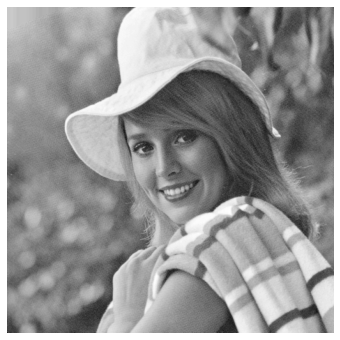

In [ ]:
show_img(img, figsize=6)

<div dir='ltr'><font face="times new roman" size=8>
1.1 
Interpolation and discretization</font></div>

<div dir='ltr'><font face="times new roman" size=6>
1.1.1. Discretization
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In this exercise, the difference of mean square error in different versions of quantize
We calculate the image with the original image and compare them.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In the first step, we define a function for discretization.
The basis of discretization is based on intensity
Map existing ones to a smaller range
and return them to the original range of 0 to 255.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
There are various ways to downscale the beginning, the easiest of which is to divide and convert the resulting number into a numerical value (we do not count decimals).
Since the number of gray levels that we want to display in this exercise is a power of 2, the pixels of the image can be shifted to the right to downscale.
(shifting to the right equals dividing by two)
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
To upscale to the initial range, we must divide the range from 0 to 255 by the number of gray levels we want and multiply the previously downscaled value by the size of the obtained parts.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
For example, if we want to have 4 gray levels,
First, we shift all the pixels to the right by 6 bits so that only 4 bits remain high.
After this, all the remaining numbers will be between 0 and 3.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In the next step, we calculate the size of the interval
which is obtained from the following formula.
</font></div>
$$
alpha = \lfloor \frac{255}{2^k -1} \rfloor
$$
<div dir='ltr'><font face="times new roman" size=4>
where k is the square root of the number of gray levels we want.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In the mentioned example, the value of k is equal to 2, as a result, the value of alpha is equal to 85.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
By multiplying 85 in downscaled values, to numbers</font></div>
$$\{0, 85, 170, 255\}$$
<div dir='ltr'><font face="times new roman" size=4>
and as a result the whole image will be displayed with these values.
</font></div>

In [ ]:
def quantize(img, k):
    n = 8 - k
    img = img >> n
    alpha = math.floor(255/(2**k - 1))
    return img * alpha

In [ ]:
def plot(img1, img2, bin):
    fig = plt.figure(figsize=(12, 10))
    fig.add_subplot(2, 2, 1)
    plt.imshow(img1, cmap='gray')
    plt.axis('off')

    fig.add_subplot(2, 2, 2)
    plt.imshow(img2, cmap='gray')
    plt.axis('off')

    hist1 = np.histogram(img1, bins=bin)
    hist2 = np.histogram(img2, bins=bin)

    fig.add_subplot(2, 2, 3)
    plt.bar(np.linspace(0,255, bin), hist1[0], width=2)

    fig.add_subplot(2, 2, 4)
    plt.bar(np.linspace(0,255, bin), hist2[0], width=2)


<div dir='ltr'><font face="times new roman" size=4>
In this section, a function is defined to calculate the error square between two grayscale images.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
It calculates the difference of two images and increases it to the power of two so that all values are positive, then adds all the errors and returns their average.
</font></div>

In [ ]:
# calculate mse
def mse_gray(img1, img2):
    diff = (img1 - img2) ** 2
    return np.sum(diff.ravel()) / (img1.shape[0] * img1.shape[1])

<div dir='ltr'><font face="times new roman" size=4>
In addition to discretization of the original photo, the discretized version after applying histogram equalization is also requested.
For this purpose, we use the predefined function in cv2 and then quantize the obtained image.
</font></div>

In [ ]:
def report(img, n):
    x = quantize(img, n)
    equ = cv2.equalizeHist(img)
    equ = quantize(equ, n)
    plot(x, equ, bin=2**n)

    print('mse between img and quantized version: ', mse_gray(img, x))
    print('mse between img and equalized+quantized version: ', mse_gray(img, equ))

<div dir='ltr'><font face="times new roman" size=4>
Below, we run the algorithms for different values of the number of gray levels and display the results.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
It can be seen that in all performances, the photo that is first equalized has more error compared to the original photo because its gray levels are differ from the original photo, but this greater error is not the reason for the lower quality of the photo.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
As can be seen, the equalized versions have a higher contrast, which is because the variance of their gray levels is greater and they have more gray levels, making it easier for our eyes to distinguish.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
It can be seen that the number of gray levels
increases, mse decreases and we get closer to the original picture.
</font></div>

mse between img and quantized version:  102.68432998657227
mse between img and equalized+quantized version:  114.1258316040039


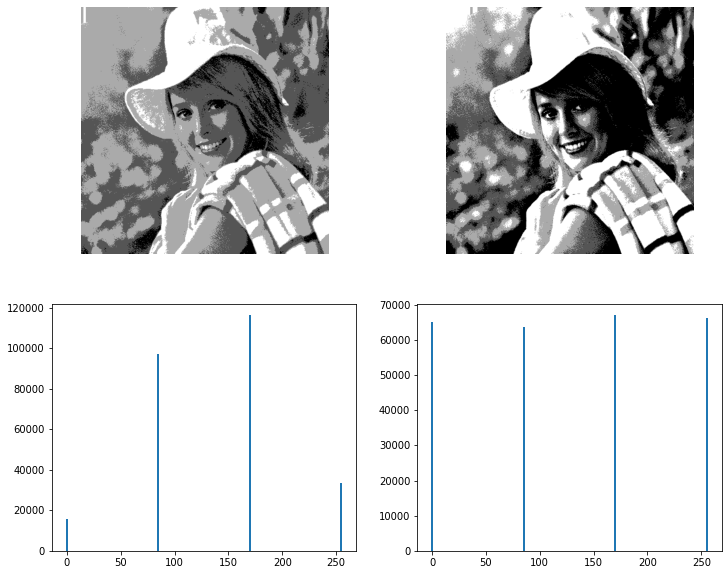

In [ ]:
report(img, 2)

mse between img and quantized version:  76.57097625732422
mse between img and equalized+quantized version:  105.14269256591797


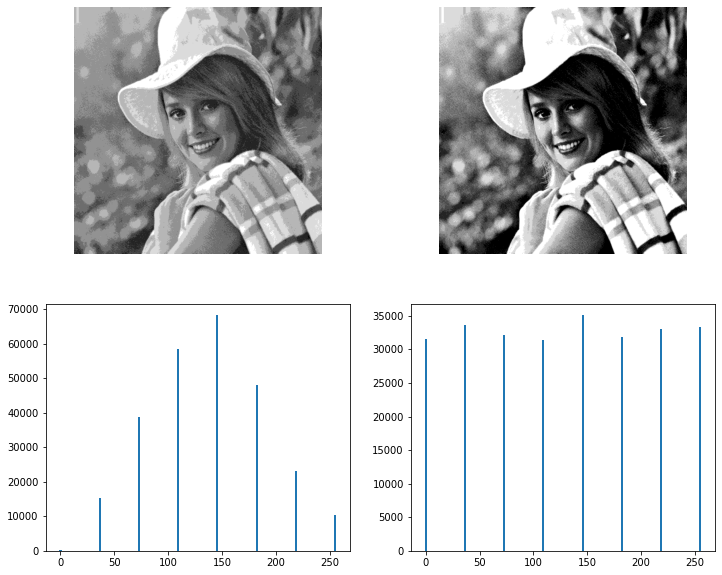

In [ ]:
report(img, 3)

mse between img and quantized version:  32.774803161621094
mse between img and equalized+quantized version:  111.1777572631836


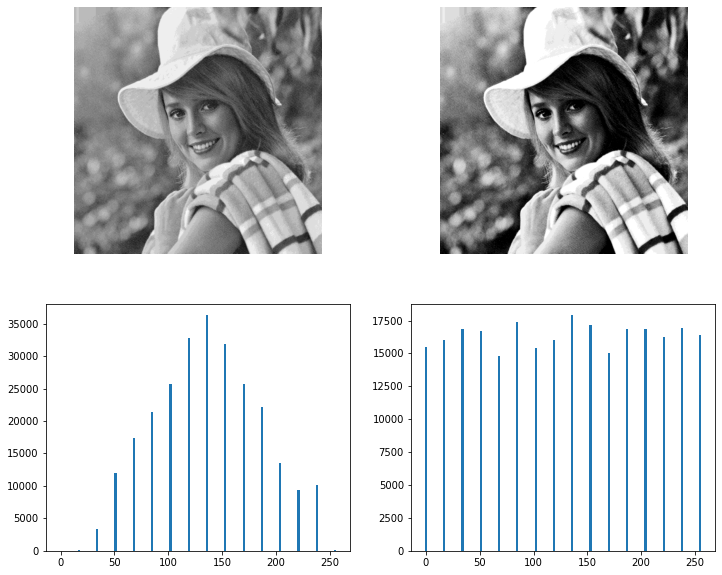

In [ ]:
report(img, 4)

mse between img and quantized version:  17.381858825683594
mse between img and equalized+quantized version:  103.0688705444336


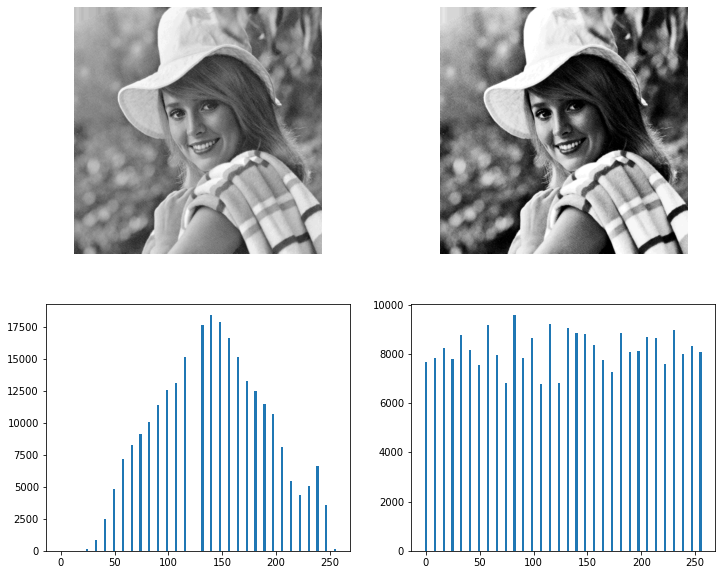

In [ ]:
report(img, 5)

mse between img and quantized version:  3.4688339233398438
mse between img and equalized+quantized version:  100.71038055419922


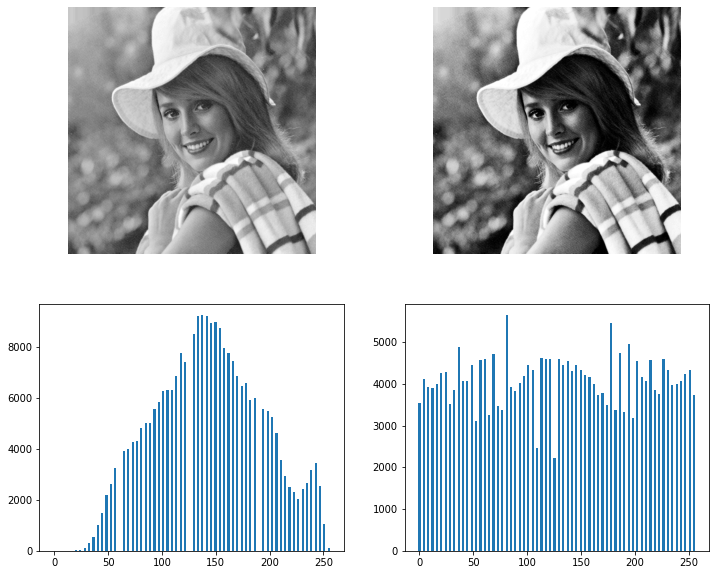

In [ ]:
report(img, 6)

mse between img and quantized version:  0.5092544555664062
mse between img and equalized+quantized version:  103.68936920166016


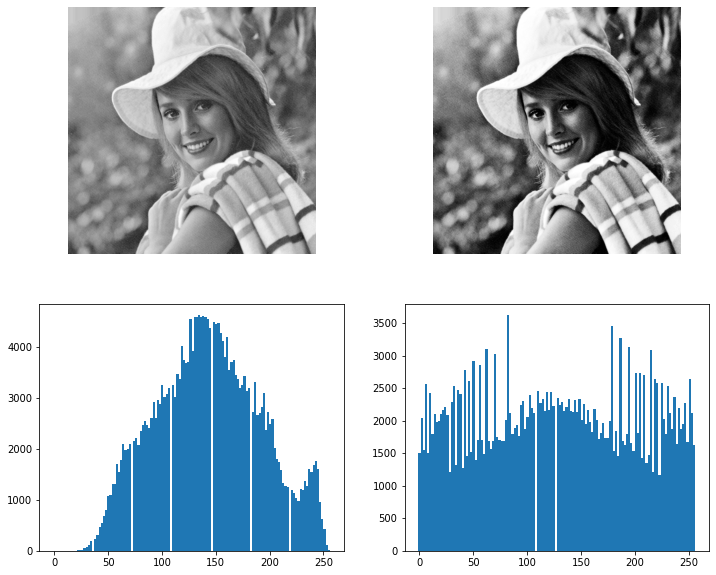

In [ ]:
report(img, 7)

$$\begin{array}{ccc}
\text{Level}&4&8&16&32&64&128\\
\text{without Equalization}&102.6&76.3&32.7&17.3&3.4&0.5\\
\text{with Equalization}&114.1&105.1&111.1&103.0&100.7&103.6
\end{array}$$

<div dir='ltr'><font face="times new roman" size=6>
1.1.2. Interpolation
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In this part, using averaging filter and remove row and column methods, we first downsample the image with factor 2.
And then we upsample the images with two zooming methods and obtain the difference between the 4 obtained images and the original image using mse.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
At first, as in the previous part, we get the image from Google Drive.
</font></div>

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=135KUD6x5oUu_Vl_d5o7EaGCVq69FGnee' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=135KUD6x5oUu_Vl_d5o7EaGCVq69FGnee" -O Goldhill.bmp && rm -rf /tmp/cookies.txt

In [ ]:
img2 = cv2.imread('Goldhill.bmp')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

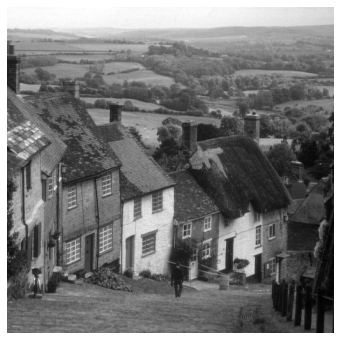

In [ ]:
show_img(img2, figsize=6)

<div dir='ltr'><font face="times new roman" size=4>
First, functions related to downsampling are implemented.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
The first method is the method of deleting rows and columns, which can be easily implemented using the capabilities of numpy array. In this way, all the rows and columns are considered and returned with a step equal to the factor given to the function.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In the second downsampling method, a filter is used to average each part of the image.
The stride for this filter is considered to be the size of one side of the filter or the same size of the filter, and it can be interpreted that it considers the average of an area for a pixel and thus causes downsampling of the image.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
At the beginning of the implementation of the function, we consider a filter with 1 filter and divide it by the number of filters so that the sum of all filters is equal to 1, and in fact, by applying the filter to an area of the image, the average of that area is calculated. can be
</font></div>

In [ ]:
# downsample with Row&Column removal

def remove_row_col(img, k):
    return img[::k,::k]

In [ ]:
# downsample using average

def average_downsample(img, filter_size):
    filter = np.ones([filter_size, filter_size])
    filter /= filter_size**2

    r = np.zeros((math.floor(img.shape[0]/filter_size), math.floor(img.shape[1]/filter_size)))
    for i in range(math.floor(img.shape[0]/filter_size)):
        for j in range(math.floor(img.shape[1]/filter_size)):
            mat = img[i*filter_size:(i+1)*filter_size, j*filter_size:(j+1)*filter_size]
            mul = mat * filter
            sum = np.sum(mul)
            r[i, j] = sum

    return r

In [ ]:
downsampled1 = remove_row_col(img2, 2)
downsampled2 = average_downsample(img2, 2)

In [ ]:
print(downsampled1.shape)
print(downsampled2.shape)

(256, 256)
(256, 256)


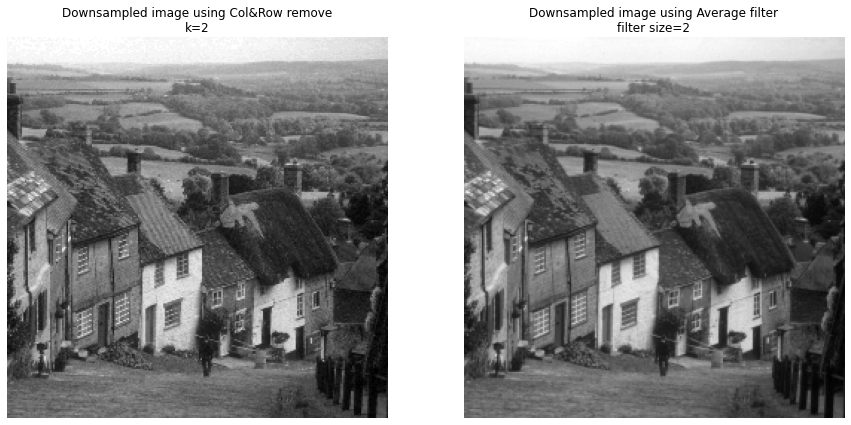

In [ ]:
titles = ['Downsampled image using Col&Row remove\nk=2', 'Downsampled image using Average filter\nfilter size=2']
show_img(downsampled1, downsampled2, title=titles, figsize=15)

<div dir='ltr'><font face="times new roman" size=4>
Next, we will implement the functions related to upsampling.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
First, we implement pixel replication or nearest neighbor interpolation.
For this, first, for each row, we create k similar rows next to it, and then for the result matrix, we do the same for the columns and the result is returned.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In the bilinear interpolation method, we use this method, based on the surrounding 4 pixels, we estimate the values between each one based on the distance to each of the four pixels.
</font></div>

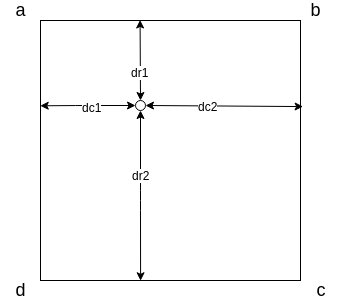

<div dir='ltr'><font face="times new roman" size=4>
For example, if we have a point like the one above, 4 distances dr1, dr2, dc1, dc2 can be defined.
And finally, the estimated value for the desired point can be obtained from the following formula.
</font></div>
$$
e = a(dr_2 \times dc_2) + b(dr_2 \times dc_1) + c(dr_1 \times dc_1) + d(dr_1 \times dc_2)
$$

<div dir='ltr'><font face="times new roman" size=4>
In the implementation of bilinear interpolation, before starting the interpolation, we do padding for the last row and column so that the last row and column do not have 0 value in the image after interpolation.
</font></div>

In [ ]:
# upsample using pixel replication (nearest neighbor interpolation)

def pixel_replication(img, k):
    res = np.repeat(img, k, axis=0)
    res = np.repeat(res, k, axis=1)
    return res

In [ ]:
# upsample using bilinear interpolation

def interpolate(img, y, x):
    x = np.asarray(x)
    y = np.asarray(y)

    x0 = np.floor(x).astype(int)
    x1 = x0 + 1
    y0 = np.floor(y).astype(int)
    y1 = y0 + 1

    x0 = np.clip(x0, 0, img.shape[1]-1);
    x1 = np.clip(x1, 0, img.shape[1]-1);
    y0 = np.clip(y0, 0, img.shape[0]-1);
    y1 = np.clip(y1, 0, img.shape[0]-1);

    Ia = img[y0, x0]
    Ib = img[y1, x0]
    Ic = img[y0, x1]
    Id = img[y1, x1]

    wa = (x1-x) * (y1-y)
    wb = (x1-x) * (y-y0)
    wc = (x-x0) * (y1-y)
    wd = (x-x0) * (y-y0)

    return wa*Ia + wb*Ib + wc*Ic + wd*Id

def bilinear_interpolation(img, k):
    res = np.zeros((img.shape[0]*k, img.shape[1]*k))
    # pad last row and last column
    x = np.zeros((img.shape[0]+1, img.shape[1]+1))
    x[0:img.shape[0], 0:img.shape[1]] = img
    x[-1, 0:img.shape[1]] = img[-1, :]
    x[0:img.shape[0], -1] = img[:, -1]
    x[-1, -1] = (img[-1, -1] + img[-1, img.shape[1]-1] + img[img.shape[0]-1, -1])/3
    # start interpolation process
    for i in range(res.shape[0]):
        for j in range(res.shape[1]):
            res[i, j] = interpolate(x, i/k, j/k)
            
    return res
                

<div dir='ltr'><font face="times new roman" size=4>
We run the upsampling algorithms on the two previously downsampled photos.
We can see that the image shrunk using remove row and column and zoomed using nearest neighbor interpolation has a smaller MSE compared to the original image, so it has less error.
</font></div>


$$\begin{array}{ccc}
\text{}&\text{Pixel Replication}&\text{Bi-linear Interpolation}\\
\text{Averaging Filter}&65.97&82.97\\
\text{Remove Row&Column}&23.08&65.00
\end{array}$$

<div dir='ltr'><font face="times new roman" size=4>
It can be seen in this image that for downsampling, remove row and column has given better results than averaging filter and for upsampling, nearest neighbor interpolation has given better results than bilinear interpolation.
</font></div>

In [ ]:
# upsample picture downsampled with remove Row&Col
upsampled1_1 = pixel_replication(downsampled1, 2)
upsampled1_2 = bilinear_interpolation(downsampled1, 2)
# upsample picture downsampled with averaging filter
upsampled2_1 = pixel_replication(downsampled2, 2)
upsampled2_2 = bilinear_interpolation(downsampled2, 2)

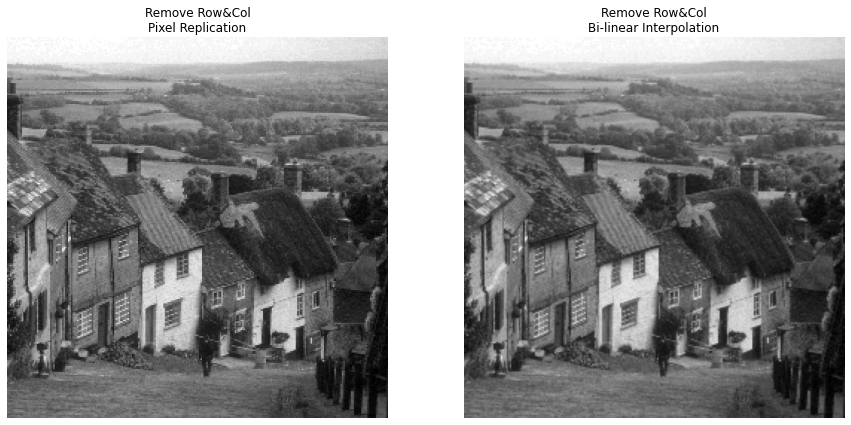

In [ ]:
titles = ['Remove Row&Col\nPixel Replication', 'Remove Row&Col\nBi-linear Interpolation']
show_img(upsampled1_1, upsampled1_2, figsize=15, title=titles)

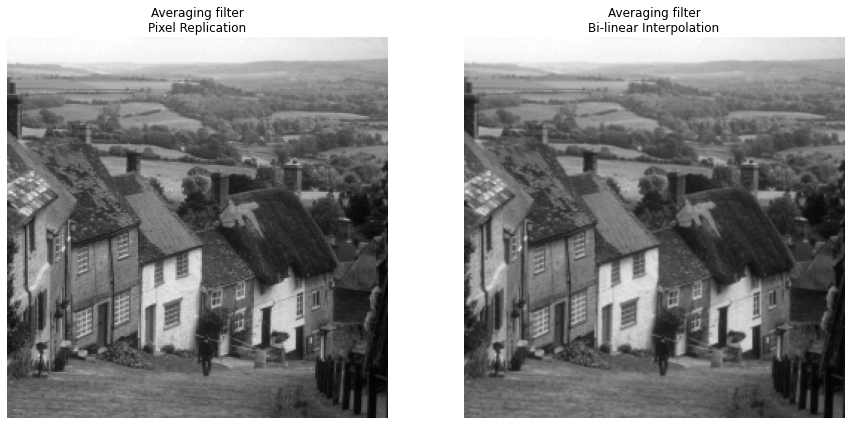

In [ ]:
titles = ['Averaging filter\nPixel Replication', 'Averaging filter\nBi-linear Interpolation']
show_img(upsampled2_1, upsampled2_2, figsize=15, title=titles)

In [ ]:
mse1_1 = mse_gray(img2, upsampled1_1)
mse1_2 = mse_gray(img2, upsampled1_2)
mse2_1 = mse_gray(img2, upsampled2_1)
mse2_2 = mse_gray(img2, upsampled2_2)

In [ ]:
print('mse between img and (remove row&col + pixel replication) is : ', mse1_1)
print('mse between img and (remove row&col + bilinear interpolation) is : ', mse1_2)
print('mse between img and (averaging filter + pixel replication) is : ', mse2_1)
print('mse between img and (averaging filter + bilinear interpolation) is : ', mse2_2)

mse between img and (remove row&col + pixel replication) is :  23.089599609375
mse between img and (remove row&col + bilinear interpolation) is :  65.00787353515625
mse between img and (averaging filter + pixel replication) is :  65.97711181640625
mse between img and (averaging filter + bilinear interpolation) is :  82.97654628753662


<div dir='ltr'><font face="times new roman" size=6>
1.1.3. Bit plane
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In this exercise, we show the images based on the sum of valuable bits. The numbers we use to display images are 8-bit, and the leftmost bit is the most significant bit because it contains more of the number.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In order to display the image based on its k-bit value, it is enough to shift the pixels of the image n-k times to the right and then again to the left by the same amount.
With this, the low-value bits are completely zero, and only the high-value bits remain.
</font></div>

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1jedyTcYUP6LUY3N7xPXL2AFaSfqzwDOp' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1jedyTcYUP6LUY3N7xPXL2AFaSfqzwDOp" -O Barbara.bmp && rm -rf /tmp/cookies.txt

In [ ]:
img3 = cv2.imread('Barbara.bmp')
img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

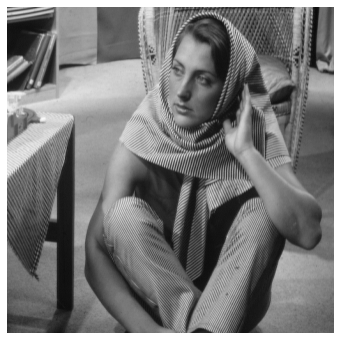

In [ ]:
show_img(img3, figsize=6)

In [ ]:
def get_bit_plane(img, k):
    n = 8-k
    res = img >> n
    res = res << n
    return res

In [ ]:
planes = []
mse_losses_img3 = []
for i in range(1, 6):
    a = get_bit_plane(img3, i)
    planes.append(a)
    mse_losses_img3.append(mse_gray(a, img3))

<div dir='ltr'><font face="times new roman" size=4>
It can be seen that in the parts of the image where we have sharp edges, the image does not lose much quality and the details are visible, which is because their intensity values are very different and the same very different values are preserved in bitplane shifting. For example, if we have an edge with one side black and one side white, (0 and 255) by shifting 6 bits to the right and then 6 bits to the left, the resulting values will be 0 and 192, which is still It has a big difference and keeps the edge.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
But if I shift the values that do not differ much, it causes the whole area where the intensity values were changing with a small difference to become one value and the details of that area are lost.
In the third image, it can be clearly seen that the sharp edges on the clothes and the chair have their details well preserved, but the parts related to the skin, where there were gray level values with a small difference, have become some special values. And the details are lost.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
It can be seen that from the fourth image onwards, the error almost decreases and the mse for this image is equal to 76.
</font></div>

In [ ]:
mse_losses_img3

[108.2321891784668,
 107.5539665222168,
 91.5988883972168,
 76.1368522644043,
 17.510936737060547]

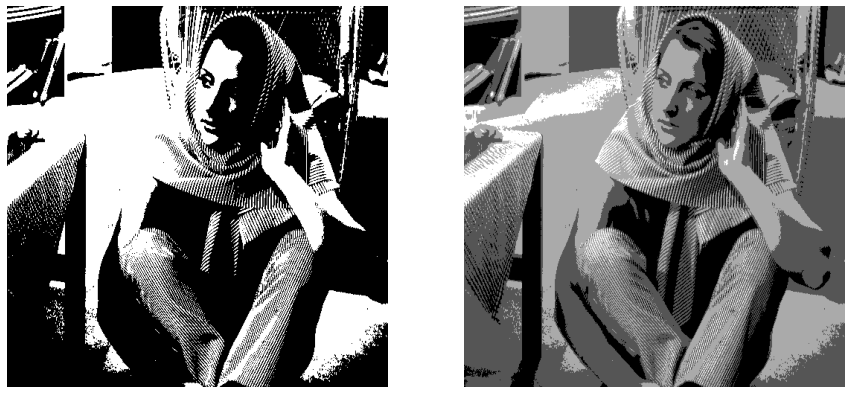

In [ ]:
show_img(planes[0], planes[1], figsize=15)

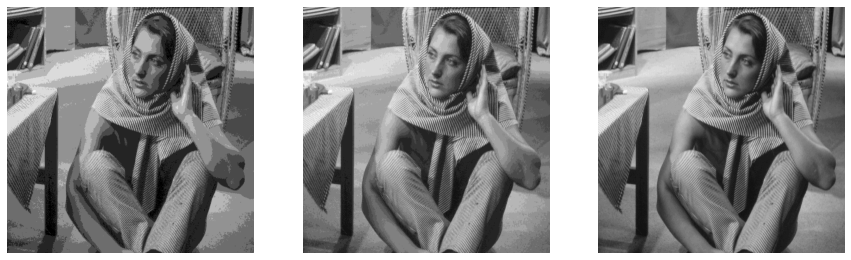

In [ ]:
show_img(planes[2], planes[3], planes[4], figsize=15)

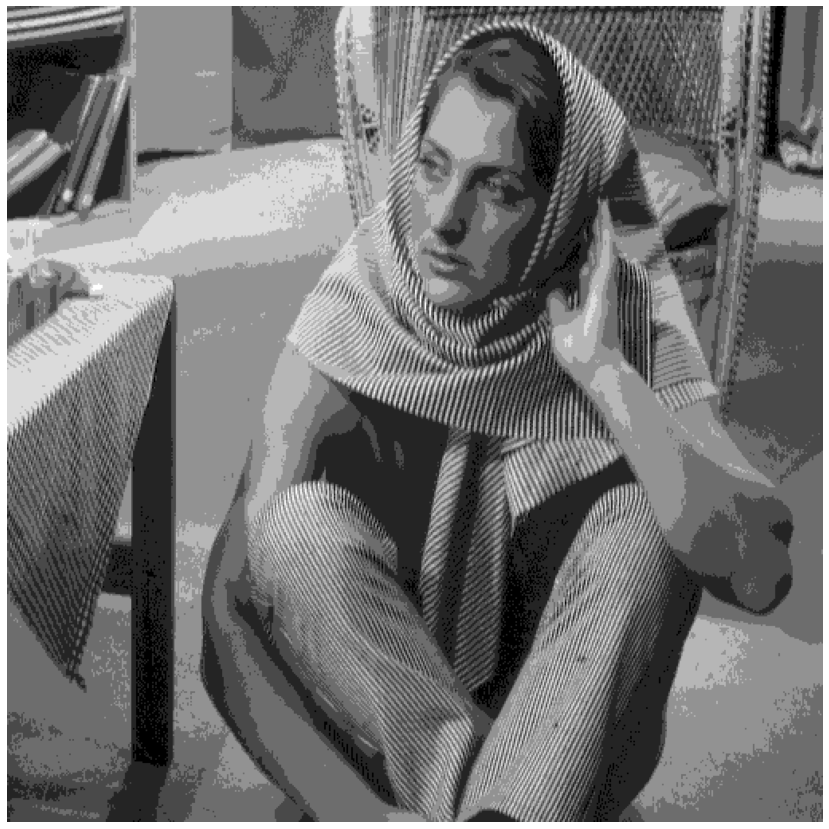

In [ ]:
show_img(planes[2], figsize=15)

<div dir='ltr'><font face="times new roman" size=8>
2. 
Contrast Adjustment
</font></div>

<div dir='ltr'><font face="times new roman" size=6>
2.1. 
Histogram Equalization
</font></div>

<div dir='ltr'><font face="times new roman" size=6>
2.1.1 Histogram calculation</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In this section, a function is defined to calculate the histogram, which scrolls through all the pixels of the image and increases the value between the values of each pixel.
</font></div>

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1yHpgs9-6-ZLEPW9LJS6JlFyj_J3YjgQS' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1yHpgs9-6-ZLEPW9LJS6JlFyj_J3YjgQS" -O Camera-Man.bmp && rm -rf /tmp/cookies.txt

In [ ]:
camera_man = cv2.imread('Camera-Man.bmp')
camera_man = cv2.cvtColor(camera_man, cv2.COLOR_BGR2GRAY)

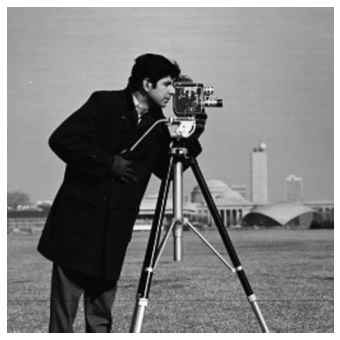

In [ ]:
show_img(camera_man, figsize=6)

In [ ]:
def compute_histogram(img):

    gray_levels = np.zeros((256), np.int32)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            gray_levels[img[i, j]] += 1

    return gray_levels

In [ ]:
hist = compute_histogram(camera_man)

<BarContainer object of 256 artists>

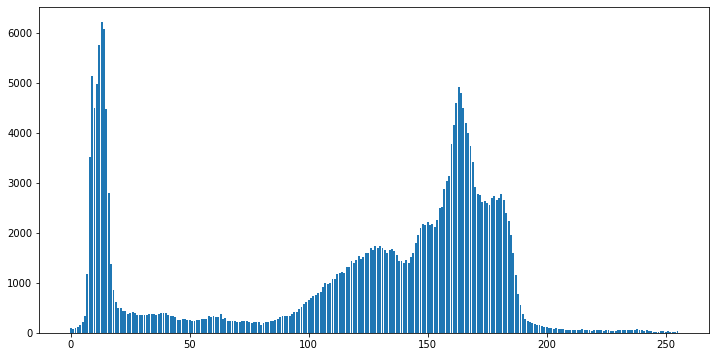

In [ ]:
plt.figure(figsize=(12,6))
plt.bar(np.linspace(0, 255, 256), hist, width=0.8)

<div dir='ltr'><font face="times new roman" size=4>
2.1.1.1 and 2.1.1.2.
Reduce image brightness
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
By using the division operation, we reduce the brightness of the image.
By comparing the two images and their histograms, we find that the lower the variance of the gray levels and the smaller the values, the lower the contrast of the image.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
One method to solve this problem is histogram equalization, in which we spread the gray levels to have all the gray levels and reach an almost uniform distribution.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In this method, we calculate the cdf value for each bin in the histogram and multiply this value by len(bin)-1. The new obtained values show to what value each interval in the previous histogram should be mapped in the new histogram.
</font></div>

In [ ]:
D = np.floor(camera_man / 3)
D = D.astype('uint8')

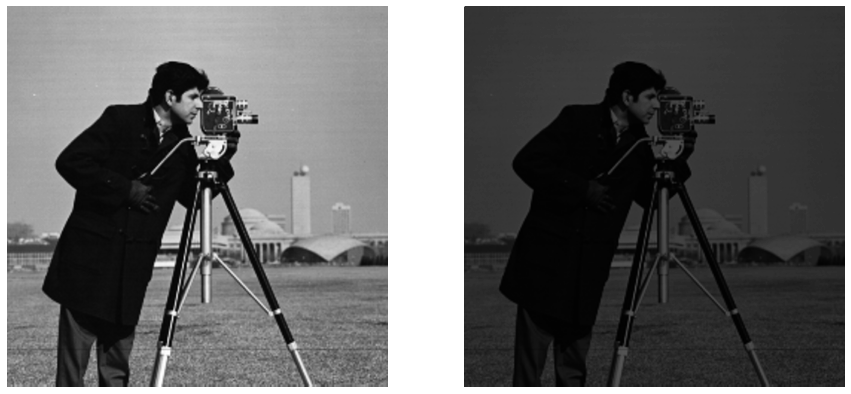

In [ ]:
D[0, 0]= 255
show_img(camera_man, D, figsize=15)

<BarContainer object of 256 artists>

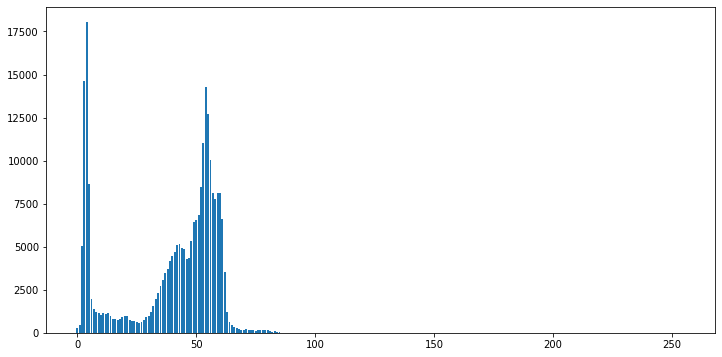

In [ ]:
histD = compute_histogram(D)
plt.figure(figsize=(12,6))
plt.bar(np.linspace(0, 255, 256), histD, width=0.8)

<div dir='ltr'><font face="times new roman" size=4>
2.1.1.3
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
Below is the histogram equalization function
Is implemented.
As mentioned, it works in this way that it first calculates the cumulative sum for the histogram and divides the obtained values by the last bin.
In fact, the last interval is the sum of all the previous intervals, so the value of cdf or cumulative distribution function is obtained with this work.
Then we should multiply the cdf by 255 to get the values for mapping the previous intervals.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
For example, if the range 64 in the previous histogram is to be converted to the range 74 in the new histogram, int(cdf × 255) will be equal to 74.
Thus, in the following function, we receive a photo and return a new photo, which is the equalized version of the original image.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
The implemented function has also been compared with the version that is in the cv2 library, and by calculating mse, it can be seen that they have very little difference and the following implementation is accurate.
</font></div>

In [ ]:
def histogram_equalization_gray(img):
    old_hist = compute_histogram(img)
    a = np.cumsum(old_hist)
    cdf = a / a[-1]
    eq = cdf * 255
    eq = eq.astype('int32')
    new_img = np.zeros((img.shape[0], img.shape[1]))
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            new_img[i, j] = eq[img[i, j]]
            
    new_img = new_img.astype('uint8')
    return new_img

In [ ]:
H = cv2.equalizeHist(D)

In [ ]:
H2 = histogram_equalization_gray(D)

In [ ]:
mse_gray(H, H2)

0.5148849487304688

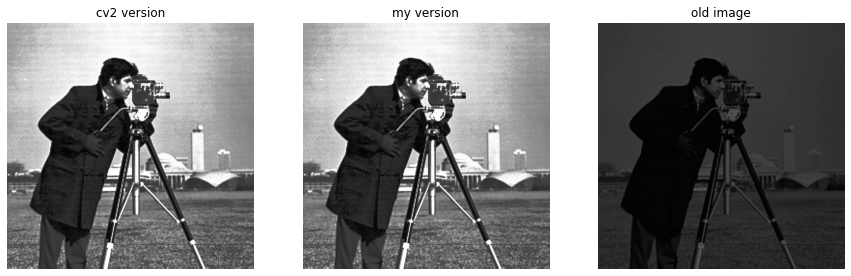

In [ ]:
show_img(H, H2, D, figsize=15, title=['cv2 version', 'my version', 'old image'])

<div dir='ltr'><font face="times new roman" size=4>
2.1.1.4
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
Next, a function for local histogram equalization
Is implemented. In this way, it receives the image and a value to divide each row and column into several parts, then it moves on windows with the size of shape ÷ size and histogram equalization
for that window area.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
It can be seen that it works well in the parts where there is an edge and there is even a slight difference in gray level, but it does not work well for the parts that have almost the same gray level, and to solve this problem, another method that works locally, such as local enhancement based on local histogram is used so that it does not create sharp edges on the borders of the windows.
</font></div>

In [ ]:
def local_histogram_equalization_gray(img, size):

    rsize = int(img.shape[0] / size)
    csize = int(img.shape[1] / size)

    new_img = np.zeros((img.shape[0], img.shape[1]))
    for i in range(int(img.shape[0] / rsize)):
        for j in range(int(img.shape[1] / csize)):
            new_img[i*rsize:(i+1)*rsize, j*csize:(j+1)*csize] = histogram_equalization_gray(img[i*rsize:(i+1)*rsize, j*csize:(j+1)*csize])
    new_img = new_img.astype('uint8')
    return new_img

In [ ]:
L = local_histogram_equalization_gray(D, 3)

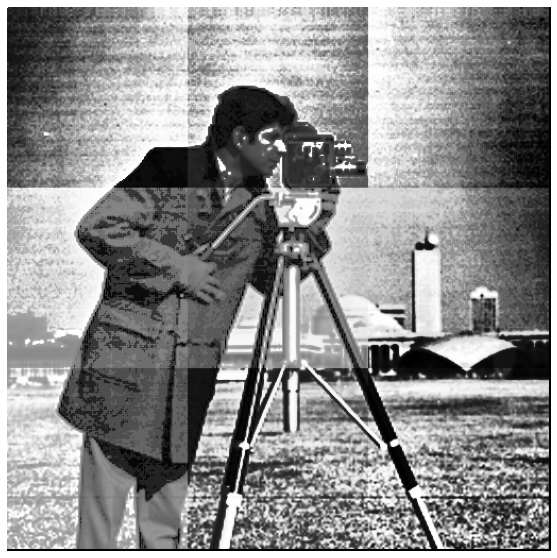

In [ ]:
show_img(L)

<div dir='ltr'><font face="times new roman" size=4>
2.1.1.5
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
By plotting the histogram of the local and global versions, it can be seen that the locally equalized photo has less gray levels, which could be because the windows have less gray levels than the entire photo, and when they are equalized, there is a big gap. It will be in between and you cannot have all the gray levels. Therefore, compared to the global version, we have less gray values.
</font></div>

In [ ]:
histL = compute_histogram(L)
histH = compute_histogram(H)

<BarContainer object of 256 artists>

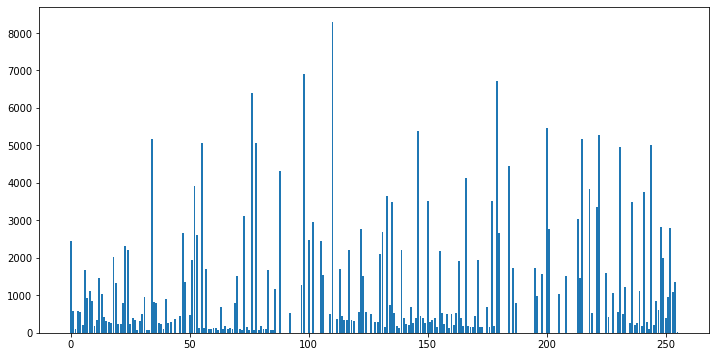

In [ ]:
plt.figure(figsize=(12,6))
plt.bar(np.linspace(0, 255, 256), histL, width=0.8)

<BarContainer object of 256 artists>

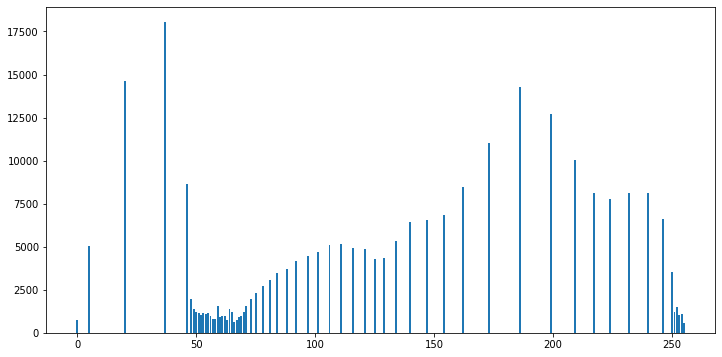

In [ ]:
plt.figure(figsize=(12,6))
plt.bar(np.linspace(0, 255, 256), histH, width=0.8)

<div dir='ltr'><font face="times new roman" size=4>
2.1.1.6
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In this part, we apply three transformation functions on photo D and check the results.
The formula of these conversions is as follows.
</font></div>
$$
\begin{gather*}
\\\\
\text{log transform} = c log(1+r)\\
\text{inverse log transform} = exp(r)^{\frac{1}{c}} -1\\
\text{gamma transform} = cr^\gamma
\\\\
\end{gather*}
$$

<div dir='ltr'><font face="times new roman" size=4>
By examining the results, we find that the log transform is suitable for increasing the contrast in dark images because the logarithm graph has a steeper slope in smaller values, as a result, it maps small values to a larger range of values, which causes gray levels that are close to each other in the original image, become a larger range of gray levels and their variance increases, which increases the contrast.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
But in inverse log transform, we see that lower values are mapped to a smaller interval and it is not suitable for dark photos at all.
But it is a good option for increasing contrast in bright images because it maps large values in the image to a larger range and increases the variance of large gray levels, which is suitable for increasing contrast in bright images.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
For gamma transformations, we have the same logic as logarithmic and exponential transformations, with the difference that the parameter $\gamma$ determines what the graph should look like. If $\gamma > 1$, it works like exponential transformation and is suitable for bright photos, and if $\gamma < 1$
It is the same as logarithmic transformation and is suitable for dark photos.
</font></div>

In [ ]:
def log_transform(img, is_natural=True):
    if (is_natural):
        log_f = np.log
    else:
        log_f = np.log10

    c = 255/(log_f(1 + np.max(img)))
    r = c * np.log(1 + img)
    return np.array(r, dtype = np.uint8)

def inverse_log_transform(img, basis=math.e):
    c = 255/(np.log(1 + np.max(img)))
    r = basis**(img/c)-1
    return np.array(r, dtype = np.uint8)


def gamma_transform(img, gamma=1):
    return np.array(255*((img/255.0) ** gamma), dtype = 'uint8')


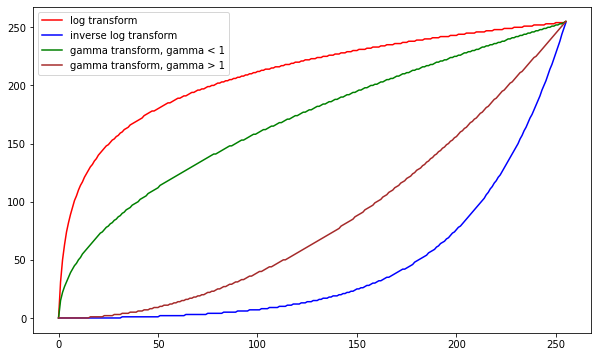

In [ ]:
x = np.arange(0, 256)
y1 = log_transform(x)
y2 = inverse_log_transform(x)
y3 = gamma_transform(x, gamma=0.5)
y4 = gamma_transform(x, gamma=2)
plt.figure(figsize=(10, 6))
plt.plot(y1, 'r', label='log transform')
plt.plot(y2, 'b', label='inverse log transform')

plt.plot(y3, 'g', label='gamma transform, gamma < 1')
plt.plot(y4, 'brown', label='gamma transform, gamma > 1')

plt.legend()
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log
  


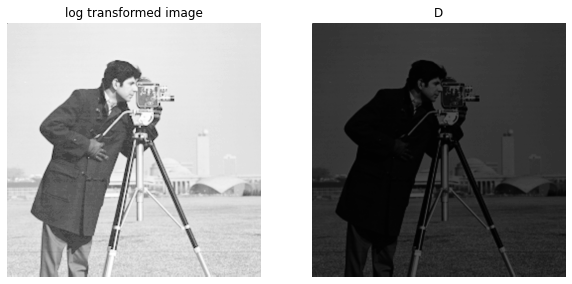

In [ ]:
D_log_t = log_transform(D, is_natural=True)
show_img(D_log_t, D, title=['log transformed image', 'D'])

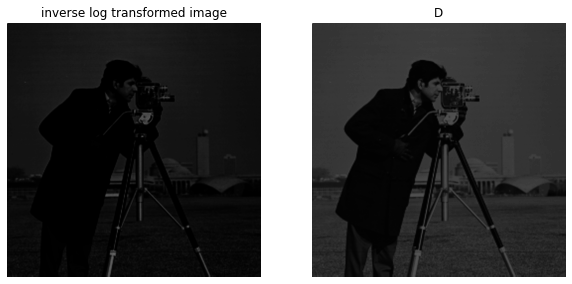

In [ ]:
D_invlog_t = inverse_log_transform(D, 10)
show_img(D_invlog_t, D, title=['inverse log transformed image', 'D'])

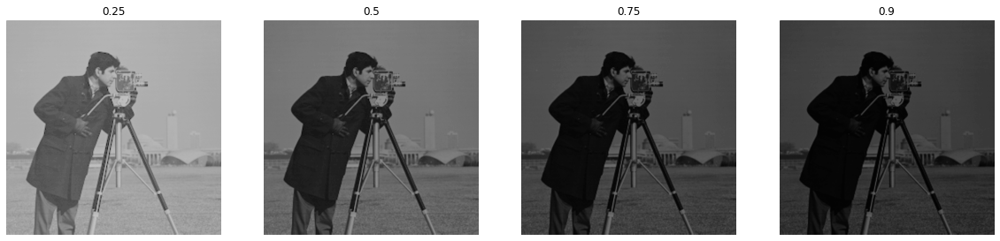

In [ ]:
D_gamma_t = []
gamma = [0.25, 0.5, 0.75, 0.9]
for i in gamma:
    D_gamma_t.append(gamma_transform(D, gamma=i))
show_img(D_gamma_t, figsize=20, title=gamma)

<div dir='ltr'><font face="times new roman" size=6>
2.1.2
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In this section, the histogram equalization operation has been performed on the main image of camera man, and the images and their corresponding histograms have been displayed.
</font></div>

In [ ]:
camera_man_equalized = histogram_equalization_gray(camera_man)
histCM = compute_histogram(camera_man)
histCME = compute_histogram(camera_man_equalized)

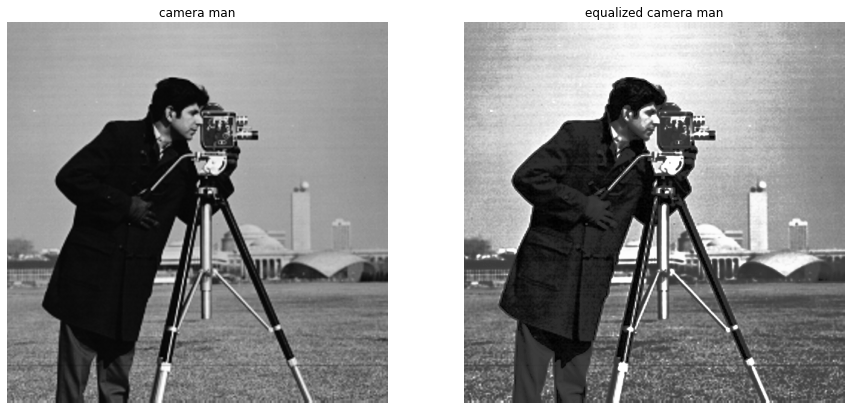

In [ ]:
show_img(camera_man, camera_man_equalized, title=['camera man', 'equalized camera man'], figsize=15)

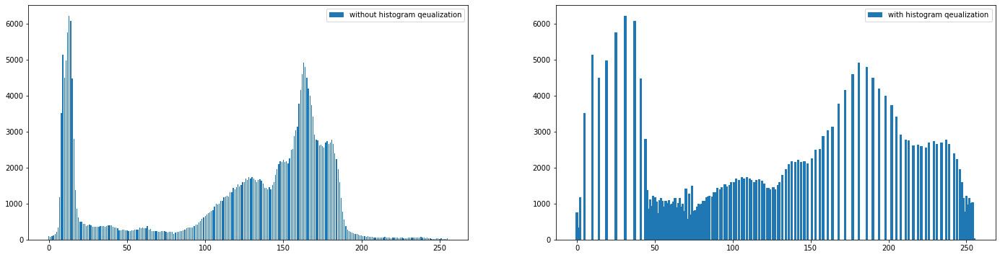

In [ ]:
plt.figure(figsize=(24, 6))
plt.subplot(1, 2, 1)
plt.bar(np.linspace(0, 255, 256), histCM, width=0.6)
plt.legend(['without histogram qeualization'])
plt.subplot(1, 2, 2)
plt.bar(np.linspace(0, 255, 256), histCME, width=1.5)
plt.legend(['with histogram qeualization'])
plt.show()

<div dir='ltr'><font face="times new roman" size=6>
2.1.3
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In this section, we compare the imadjust function with histeq.
Since the imadjust function is related to MATLAB, we implement it similarly for Python.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
By examining the imadjust function with different gammas, we come to the conclusion that this function works almost linearly and does not deviate too far from the original image, and a function is applied to all the pixels, but it is not linear for histeq, and a series of pixels have their values change and don't do another series, and that's why we get further away from the original photo compared to imadjust.
</font></div>

In [ ]:
def imadjust(x,c=0,d=255,gamma=1):
    a = x.min()
    b = x.max()
    y = (((x - a) / (b - a)) ** gamma) * (d - c) + c
    return y

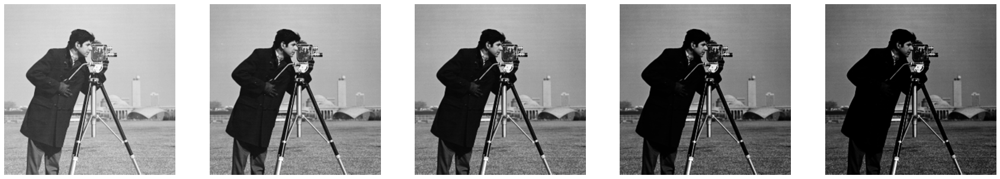

In [ ]:
gamma = [0.5, 0.8, 1, 1.5, 2]
imadjs = []
for i in gamma:
    imadjs.append(imadjust(camera_man, gamma=i))

show_img(imadjs, figsize=30)

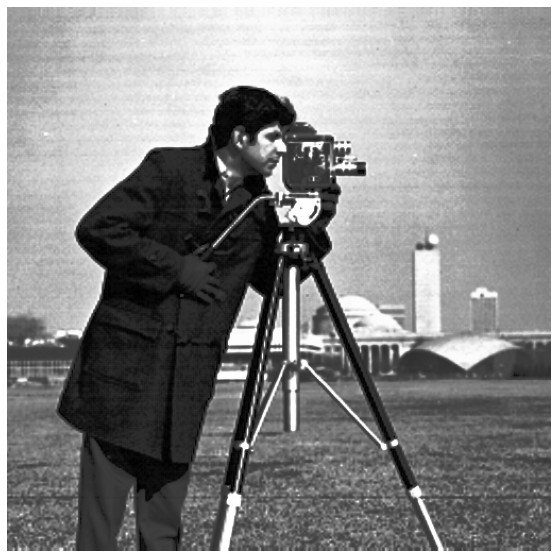

In [ ]:
show_img(camera_man_equalized)

<div dir='ltr'><font face="times new roman" size=6>
2.1. 
Local(Adaptive) Histogram Equalization
</font></div>

<div dir='ltr'><font face="times new roman" size=6>
2.2.1
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
In this section, we implement local histogram equalization with different window sizes on 4 photos and compare the results.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
It can be seen that local histogram equalization increases the contrast locally in each window. And since the values in a window may be very close to each other, it shows the details of a window much more clearly. The gray levels inside a window are less than the whole image, and playing them can show more details.
But in the parts that are almost homogeneous (like the sky in the first picture) it causes noise because the gray level values are very close to each other and spreading them will spoil the image.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
Compared to global histogram equalization, it can be said that the local version works better for images that have very dark or very bright points, but as mentioned, it causes noise for areas that have almost identical gray levels.
</font></div>
<div dir='ltr'><font face="times new roman" size=4>
By increasing the window, we examine the operation in a smaller range, which causes more noise in areas that are homogeneous and increases contrast more in areas that are not homogeneous.
</font></div>

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=13SZIjC7xrShsECene5cI0-FoZAZKREnc' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=13SZIjC7xrShsECene5cI0-FoZAZKREnc" -O HE.zip && rm -rf /tmp/cookies.txt

In [ ]:
!unzip -n HE.zip

In [ ]:
HE = []
for i in range(4):
    HE.append(cv2.imread('HE'+str(i+1)+'.jpg'))
    HE[i] = cv2.cvtColor(HE[i], cv2.COLOR_BGR2GRAY)

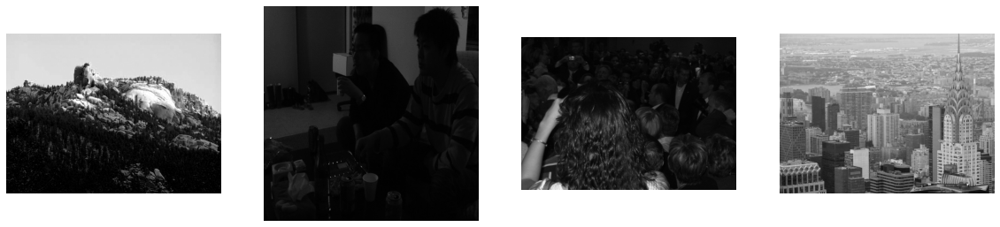

In [ ]:
show_img(HE, figsize=20)

In [ ]:
def get_AHE(img, window):
    ims = []
    for i in window:
        a = local_histogram_equalization_gray(img, i)
        ims.append(a)
    return ims

In [ ]:
window = [2, 3, 5, 7]
he0 = get_AHE(HE[0], window)

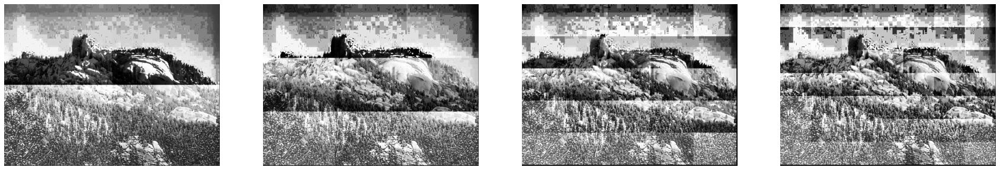

In [ ]:
show_img(he0, figsize=30)

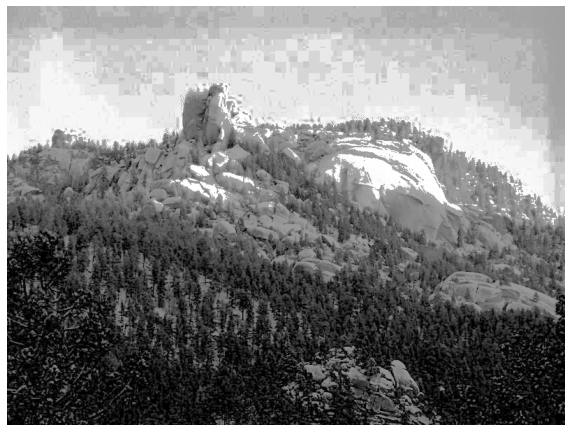

In [ ]:
show_img(histogram_equalization_gray(HE[0]))

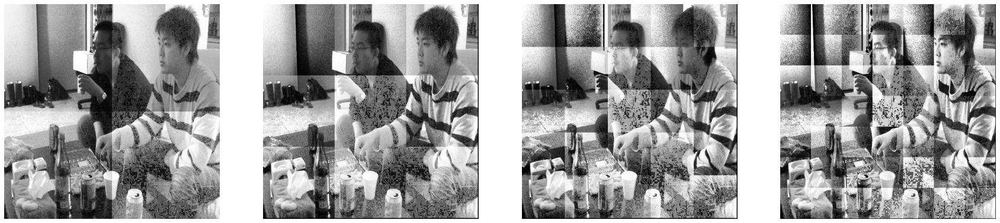

In [ ]:
he1 = get_AHE(HE[1], window)
show_img(he1, figsize=30)

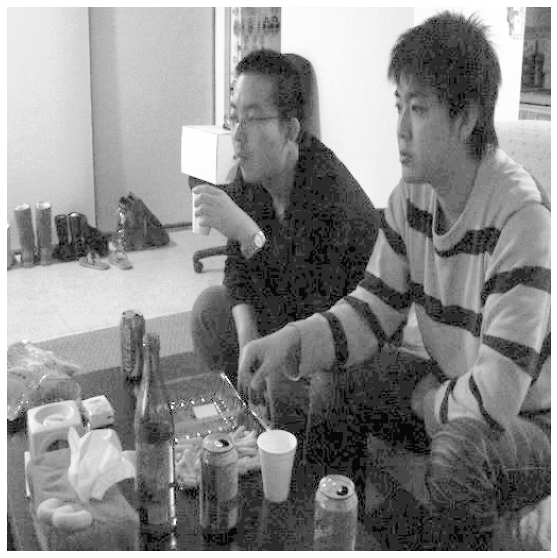

In [ ]:
show_img(histogram_equalization_gray(HE[1]))

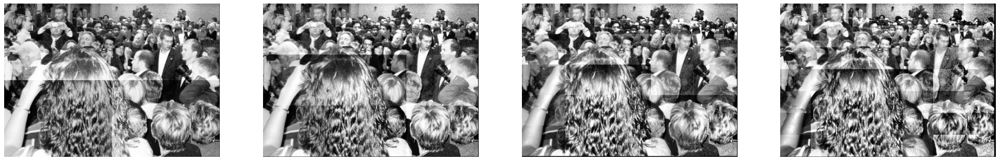

In [ ]:
he2 = get_AHE(HE[2], window)
show_img(he2, figsize=30)

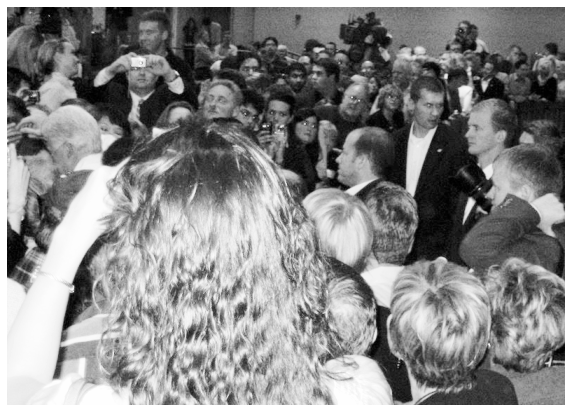

In [ ]:
show_img(histogram_equalization_gray(HE[2]))

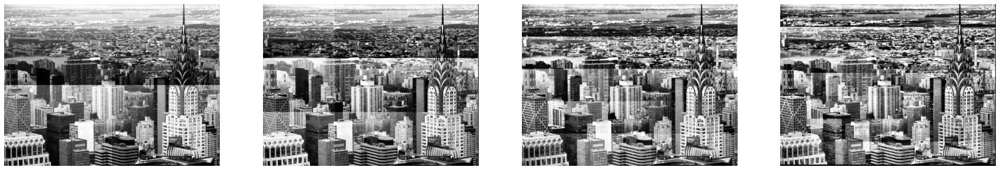

In [ ]:
he3 = get_AHE(HE[3], window)
show_img(he3, figsize=30)

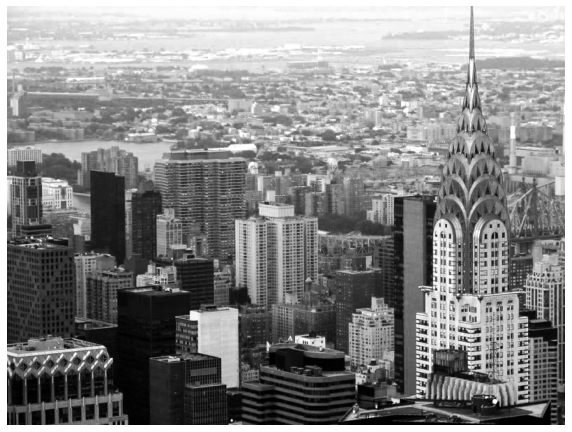

In [ ]:
show_img(histogram_equalization_gray(HE[3]))